In [1]:
#pip install albumentations

In [2]:
import albumentations
print(albumentations.__file__)

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.10 (you have 1.4.9). Upgrade using: pip install --upgrade albumentations


C:\Users\krish\anaconda3\Lib\site-packages\albumentations\__init__.py


In [3]:
#  1)Locate Albumentations Package
#  2)Locate the core subdirectory within the Albumentations directory. You should see "bbox_utils.py" listed.
#  3)Replace the file bbox_utils by the provided 'bbox_utils.py'.

In [4]:
#Follow the above instruction to have appropriate results..

# IMPORTING LIBRARIES

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision
import torchvision.transforms as T

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from PIL import Image
import numpy as np
import os

import albumentations as A
from albumentations.pytorch import ToTensorV2

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json

from torch.optim import SGD
from torch.optim.lr_scheduler import StepLR

from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from engine import train_one_epoch, evaluate
import utils

from tqdm import tqdm
import time

import torchvision.ops as ops
from torchvision.ops import nms

from PIL import Image, ExifTags

# LOADING THE IMAGES AND JSON FILE

In [6]:
# Path to data and JSON file
train = 'coco/train2017'
annotations = 'coco/instances_train2017.json'
val = 'coco/val2017'
val_annotations = 'coco/instances_val2017.json'

In [7]:
# Load COCO annotation file and generate category ID mappings
with open(annotations) as f:
    coco_data = json.load(f)

In [8]:
categories = coco_data['categories']
original_ids = [category['id'] for category in categories]
id_to_sequential_id = {original_id: idx for idx, original_id in enumerate(original_ids)}
sequential_id_to_name = {idx: category['name'] for idx, category in enumerate(categories)}

In [9]:
#Sequential mapping to all the categories, so as to avoid any errors during later stages

In [10]:
print(id_to_sequential_id)

{1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 13: 11, 14: 12, 15: 13, 16: 14, 17: 15, 18: 16, 19: 17, 20: 18, 21: 19, 22: 20, 23: 21, 24: 22, 25: 23, 27: 24, 28: 25, 31: 26, 32: 27, 33: 28, 34: 29, 35: 30, 36: 31, 37: 32, 38: 33, 39: 34, 40: 35, 41: 36, 42: 37, 43: 38, 44: 39, 46: 40, 47: 41, 48: 42, 49: 43, 50: 44, 51: 45, 52: 46, 53: 47, 54: 48, 55: 49, 56: 50, 57: 51, 58: 52, 59: 53, 60: 54, 61: 55, 62: 56, 63: 57, 64: 58, 65: 59, 67: 60, 70: 61, 72: 62, 73: 63, 74: 64, 75: 65, 76: 66, 77: 67, 78: 68, 79: 69, 80: 70, 81: 71, 82: 72, 84: 73, 85: 74, 86: 75, 87: 76, 88: 77, 89: 78, 90: 79}


In [11]:
print(sequential_id_to_name)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [12]:
class COCODataset(Dataset):
    def __init__(self, root, annFile, transform=None):
        self.root = root
        self.coco = COCO(annFile)
        self.ids = list(self.coco.imgs.keys())
        self.transform = transform

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, index):
        img_id = self.ids[index]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']
        img = Image.open(os.path.join(self.root, path)).convert('RGB')
        img_width, img_height = img_info['width'], img_info['height']
        
        img = np.array(img).astype(np.float32) / 255.0  # Convert to float and normalize

        boxes = []
        category_ids = []
        areas = []
        iscrowd = []
        for ann in anns:
            bbox = ann['bbox']
            
            # Convert [x_min, y_min, width, height] to [x_min, y_min, x_max, y_max]
            x_min, y_min, width, height = bbox
            x_max = x_min + width
            y_max = y_min + height
            # Add the condition to check if x_max > x_min and y_max > y_min
            if x_max > x_min and y_max > y_min:
                boxes.append([x_min, y_min, x_max, y_max])
                category_ids.append(id_to_sequential_id[ann['category_id']])
                areas.append(width * height)
                iscrowd.append(ann.get('iscrowd', 0))

        if self.transform:
            transformed = self.transform(image=img, bboxes=boxes, category_ids=category_ids)
            img = transformed['image']
            boxes = transformed['bboxes']
            category_ids = transformed['category_ids']

        if len(boxes) == 0:
            return self.__getitem__((index + 1) % len(self.ids))  # Skip images with no bounding boxes

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        category_ids = torch.as_tensor(category_ids, dtype=torch.int64)
        areas = torch.as_tensor(areas, dtype=torch.float32)
        iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {}
        target['boxes'] = boxes
        target['labels'] = category_ids
        target['image_id'] = torch.tensor([img_id])
        target['area'] = areas
        target['iscrowd'] = iscrowd

        return img, target

# IMAGE AUGMENTATION WITH "ALBUMENTATIONS"

In [13]:
# Albumentations transformations
transform = A.Compose([
    A.Blur(blur_limit=3, p=0.2),
    A.RandomBrightnessContrast(p=0.2),
    A.Resize(height=800,width=800),
    A.HorizontalFlip(p=0.3),
    A.VerticalFlip(p=0.3),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))

transform_val = A.Compose([
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))

C:\Users\krish\anaconda3\Lib\site-packages\albumentations\core\composition.py:147: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


# DATASET INSTANCES FOR TRAIN AND VALIDATION DATA

In [14]:
# Instantiate the dataset
coco_ = COCODataset(root=train, annFile=annotations, transform=transform)

loading annotations into memory...
Done (t=31.66s)
creating index...
index created!


In [15]:
len(coco_)

118287

In [16]:
# Take the subset of images..
subset_indices = list(range(118287))
coco = Subset(coco_, subset_indices)

In [17]:
len(coco)

118287

In [18]:
coco_val = COCODataset(root=val, annFile=val_annotations, transform=transform_val)

loading annotations into memory...
Done (t=1.08s)
creating index...
index created!


In [19]:
len(coco_val)

5000

# DATALOADER INSTANCE 

In [20]:
dataloader = DataLoader(coco, batch_size=1, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

In [21]:
dataloader_test = DataLoader(coco_val, batch_size=1, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# HELPER VISUALIZATION FUNCTION

In [22]:
#https://albumentations.ai/docs/examples/example_bboxes/

In [23]:
# Visualization functions
BOX_COLOR = (255, 0, 0)  # Red
TEXT_COLOR = (255, 255, 255)  # White

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, x_max, y_max = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_max), int(y_min), int(y_max)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img

def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)
    plt.show()


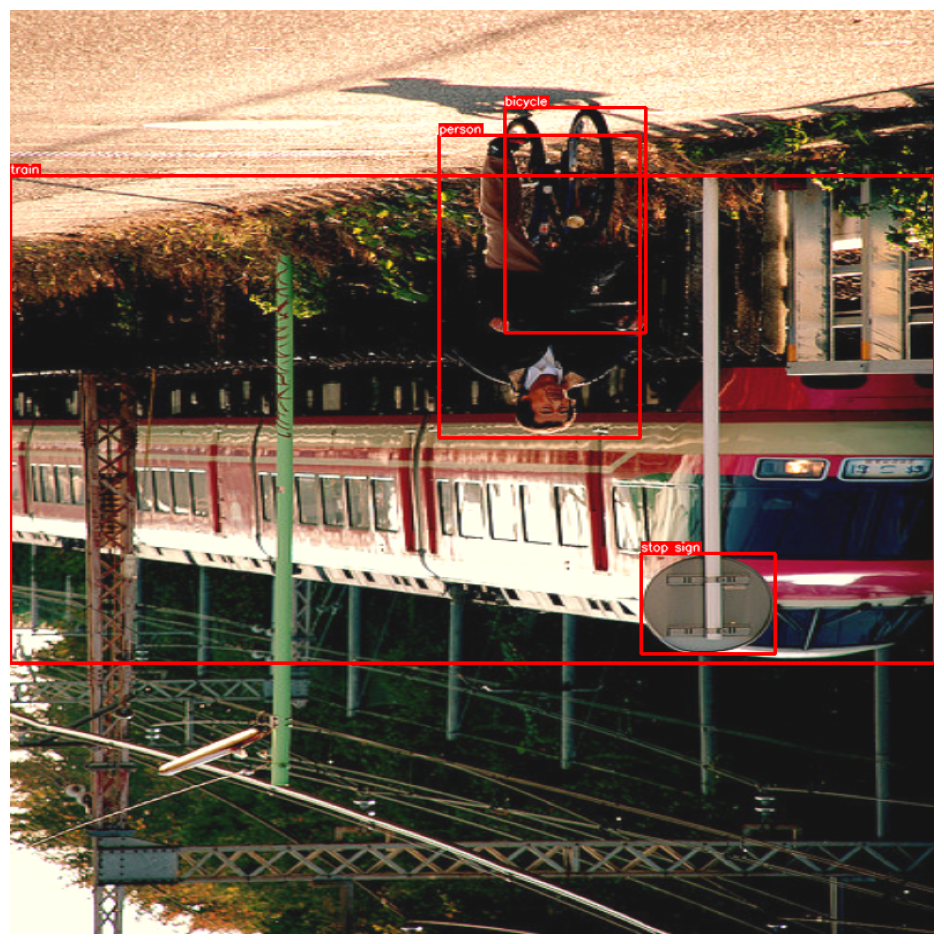

In [24]:
# visualizing one transformed image
img, target = coco[13]

# Convert image to HWC format and denormalize
image = img.permute(1, 2, 0).cpu().numpy()
image = (image * 255).astype(np.uint8)

# Get bounding boxes and labels
bboxes = target['boxes'].cpu().numpy().tolist()
category_ids = target['labels'].cpu().numpy().tolist()

# Visualize
visualize(image, bboxes, category_ids, sequential_id_to_name)

In [25]:
target

{'boxes': tensor([[428.6355,  84.1625, 550.7289, 279.0375],
         [  0.0000, 143.5000, 800.0000, 565.0250],
         [371.2336, 108.1125, 545.3458, 370.3500],
         [546.8411, 470.6000, 662.0561, 557.0250]]),
 'labels': tensor([ 1,  6,  0, 11]),
 'image_id': tensor([483108]),
 'area': tensor([ 10183.3877, 144330.1562,  19541.9395,   4261.7896]),
 'iscrowd': tensor([0, 0, 0, 0])}

# MODEL DEFINITION

In [26]:
def model(num_classes):
    
    # Load the pretrained Faster R-CNN model.
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT) #Load the latest weights..

    in_feats = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes)
    
    return model

In [27]:
# Check what device is available and print it
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f'Using device: {device}')

Using device: cuda


In [28]:
num_classes = 80 + 1  # 80 object categories + 1 background

In [29]:
# Get the model and move it to the GPU
model = model(num_classes)
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# OPTIMIZER AND LR-SCHEDULER

In [30]:
# Define the optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

# Define the learning rate scheduler
lr_scheduler = StepLR(optimizer, step_size=1, gamma=0.1)

# TRAINING-PHASE

In [31]:
training_losses = []

num_epochs = 4
for epoch in range(num_epochs):
    model.train()
    start_time = time.time()
    running_loss = 0.0

    # Use tqdm for progress bar
    with tqdm(dataloader, unit="batch") as tepoch:
        for images, targets in tepoch:
            tepoch.set_description(f"Epoch {epoch+1}/{num_epochs}")
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass
            try:
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())
                running_loss += losses.item()

                # Backward pass
                optimizer.zero_grad()
                losses.backward()
                optimizer.step()

                tepoch.set_postfix(loss=losses.item())

            except ValueError as ve:
                continue
            except Exception as e:
                continue

    # Update the learning rate
    lr_scheduler.step()

    # Compute the average loss
    avg_loss = running_loss / len(dataloader)

    # Store the metrics
    training_losses.append(avg_loss)

    # Print training statistics
    end_time = time.time()
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}, Time: {end_time - start_time:.2f} seconds")

print("Training complete.")

Epoch 1/4: 100%|██████████| 118287/118287 [6:30:08<00:00,  5.05batch/s, loss=1.02]    


Epoch [1/4], Loss: 0.6346, Time: 23408.12 seconds


Epoch 2/4: 100%|██████████| 118287/118287 [6:26:09<00:00,  5.11batch/s, loss=0.518]   


Epoch [2/4], Loss: 0.5408, Time: 23169.39 seconds


Epoch 3/4: 100%|██████████| 118287/118287 [6:26:19<00:00,  5.10batch/s, loss=0.368]   


Epoch [3/4], Loss: 0.5178, Time: 23179.71 seconds


Epoch 4/4: 100%|██████████| 118287/118287 [6:26:15<00:00,  5.10batch/s, loss=0.131]   

Epoch [4/4], Loss: 0.5148, Time: 23175.66 seconds
Training complete.


In [32]:
#The training process of the model has stabilized.

In [33]:
#Additional training epochs are unlikely to result in further improvements in performance

# SAVING AND LOADING THE TRAINED MODEL

In [34]:
# Define the model name
model_name = "Luna.pth"

# The path to save the model
model_save_path = r'C:\Users\krish\Documents\Summer\Project\model\Luna.pth'

# Save the model
torch.save(model.state_dict(), model_save_path)
print(f"Model saved successfully as {model_name}.")

Model saved successfully as Luna.pth.


In [35]:
# Load the model
model.load_state_dict(torch.load(model_save_path))
model.to(device)
print(f"Model loaded successfully from {model_save_path}.")

Model loaded successfully from C:\Users\krish\Documents\Summer\Project\model\Luna.pth.


In [36]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# MODEL PERFORMANCE ON VALIDATION DATA

In [37]:
BOX_COLOR = (255, 0, 0) # Red for predictions
TEXT_COLOR = (255, 255, 255) # White
GT_BOX_COLOR = (0, 255, 0) # Green for ground truth

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, x_max, y_max = [int(coord) for coord in bbox]
    
    # Draw the bounding box
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    # Position for the text label
    text_org = (x_min, y_min - 10 if y_min - 10 > 10 else y_min + 20)
    
    # Background rectangle for text
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
    cv2.rectangle(img, (text_org[0] - 1, text_org[1] - text_height - 2), 
                  (text_org[0] + text_width + 1, text_org[1] + 2), color, -1)
    
    # Draw the text label
    cv2.putText(img, class_name, text_org, cv2.FONT_HERSHEY_SIMPLEX, 0.5, TEXT_COLOR, thickness=1, lineType=cv2.LINE_AA)
    return img

def visualize_predictions(images, predictions, targets, category_id_to_name, num_images=3):
    for img, prediction, target in zip(images[:num_images], predictions[:num_images], targets[:num_images]):
        img = img.permute(1, 2, 0).cpu().numpy()
        img = (img * 255).astype(np.uint8)

        # Visualize ground truth
        for bbox, label in zip(target['boxes'].cpu().numpy(), target['labels'].cpu().numpy()):
            class_name = category_id_to_name[label]
            img = visualize_bbox(img, bbox, class_name, color=GT_BOX_COLOR)

        # Visualize predictions
        for bbox, label in zip(prediction['boxes'].cpu().numpy(), prediction['labels'].cpu().numpy()):
            class_name = category_id_to_name[label]
            img = visualize_bbox(img, bbox, class_name, color=BOX_COLOR)

        plt.figure(figsize=(12, 12))
        plt.axis('off')
        plt.imshow(img)
        plt.show()

In [38]:
def validation(model, dataloader, device, num_images=3):
    model.eval()
    predictions = []
    image_ids = []
    images = []
    targets = []

    with torch.no_grad():
        for images_batch, targets_batch in tqdm(dataloader):
            images_batch = list(img.to(device) for img in images_batch)
            outputs = model(images_batch)

            predictions.extend(outputs)
            image_ids.extend([target["image_id"].item() for target in targets_batch])
            images.extend(images_batch)
            targets.extend(targets_batch)
            
            if len(predictions) >= num_images:
                break

    # Load COCO ground truth annotations
    coco_gt = COCO(val_annotations)
    category_id_to_name = {cat['id']: cat['name'] for cat in coco_gt.loadCats(coco_gt.getCatIds())}

    # Visualize predictions and ground truth
    visualize_predictions(images, predictions, targets, sequential_id_to_name, num_images)

  0%|          | 6/5000 [00:02<33:48,  2.46it/s]


loading annotations into memory...
Done (t=22.70s)
creating index...
index created!


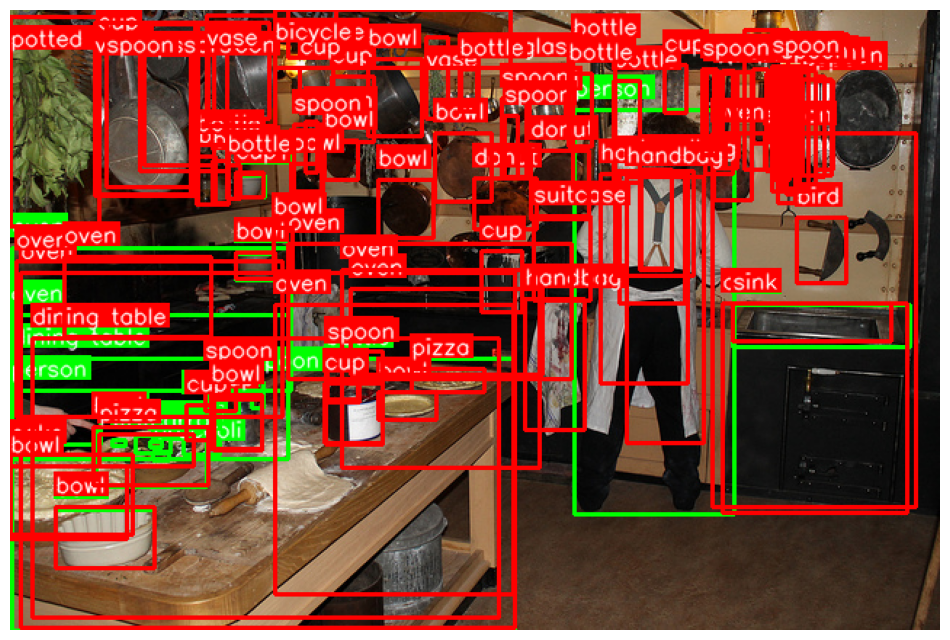

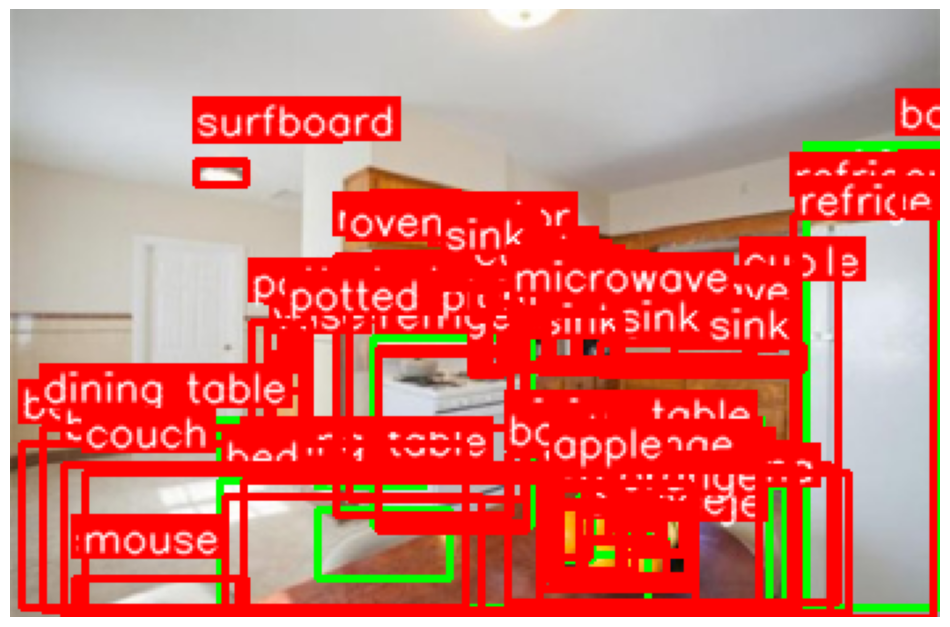

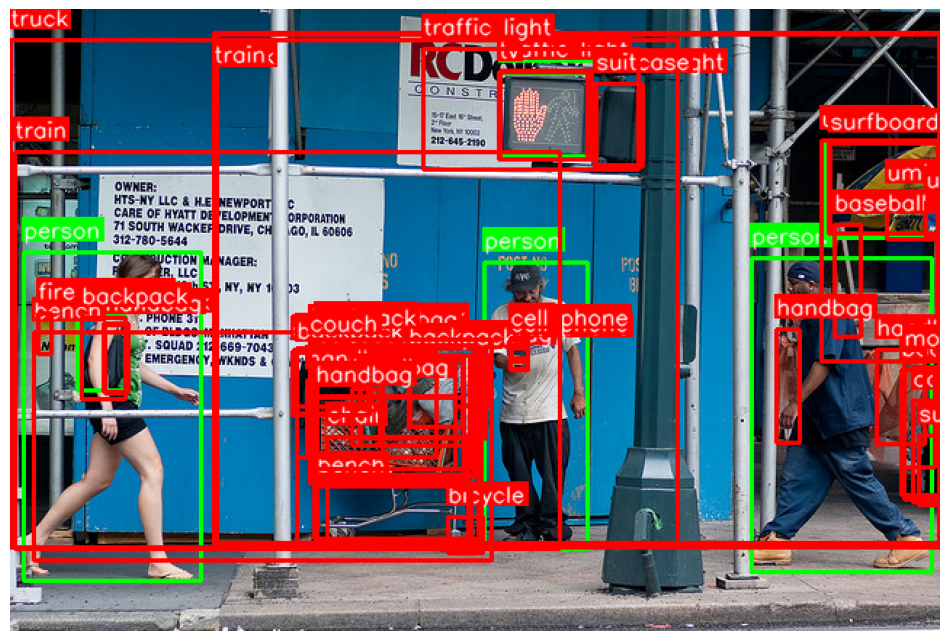

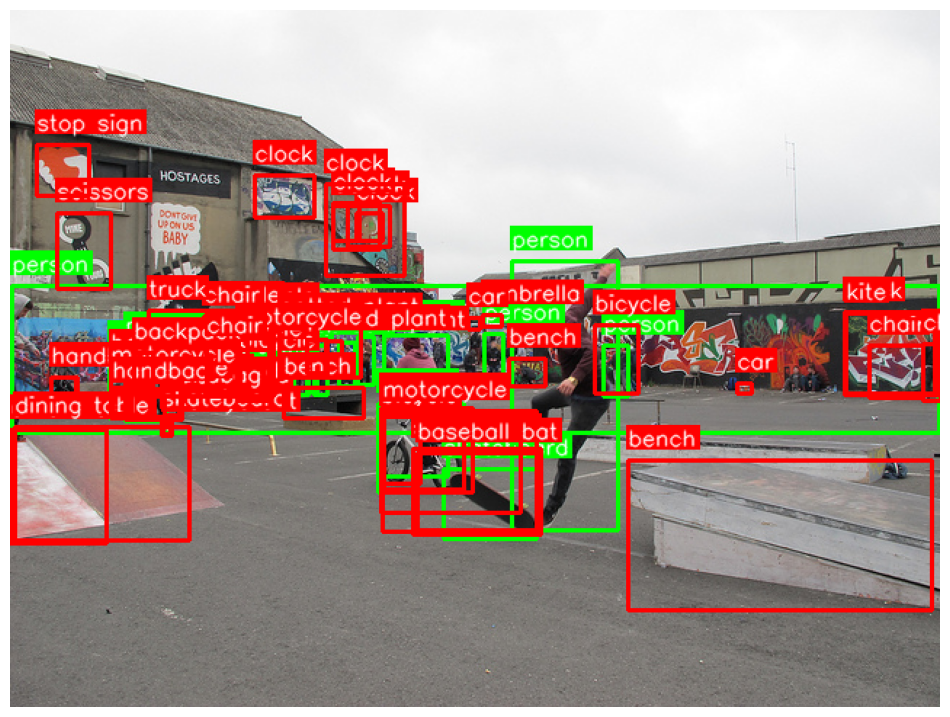

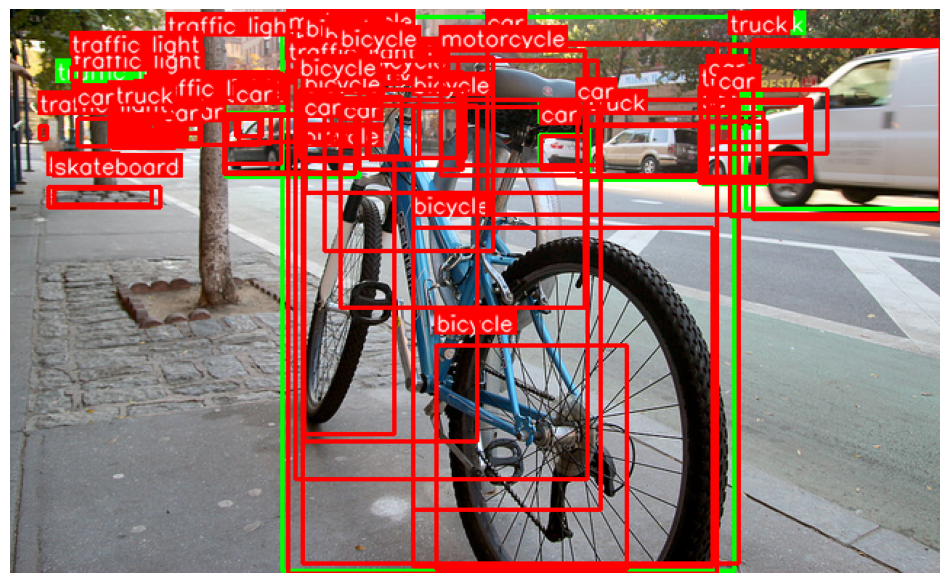

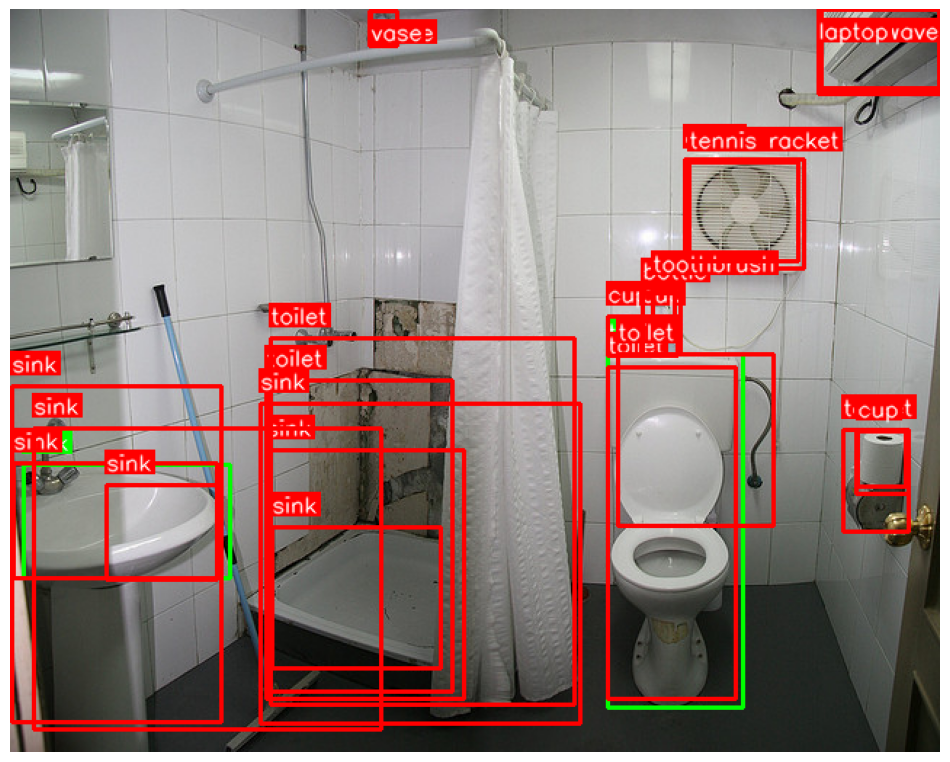

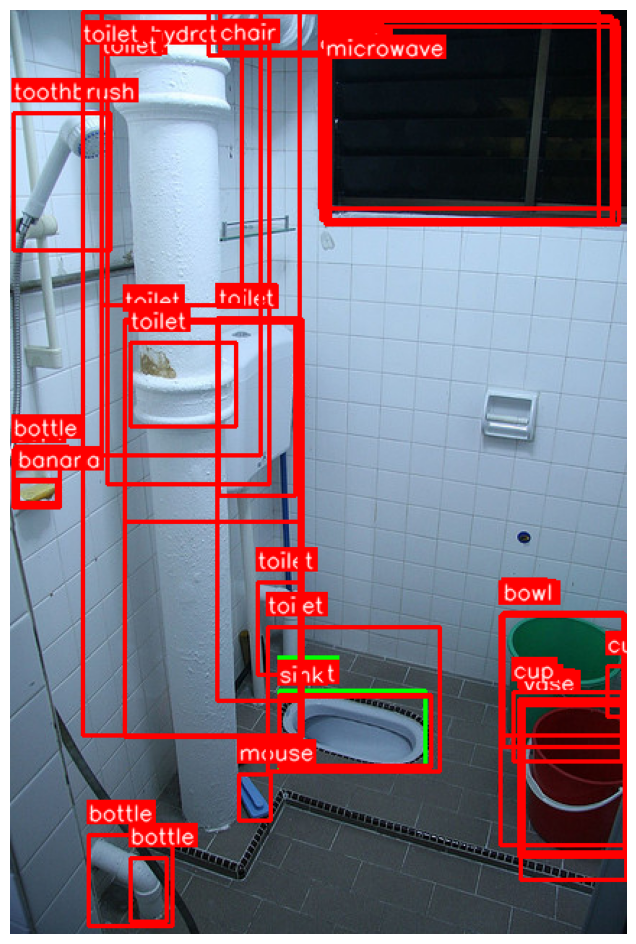

In [39]:
# Perform visualization of a few predictions
validation(model, dataloader_test, device, num_images=7)

In [40]:
#The model is generating multiple bounding boxes for the same object or producing boxes for non-existent objects

# EVALUATION METRICS

In [41]:
# Load COCO ground truth annotations
coco_truth = COCO(val_annotations)

loading annotations into memory...
Done (t=1.09s)
creating index...
index created!


In [42]:
# Create a reverse mapping 
sequential_id_to_original_id = {v: k for k, v in id_to_sequential_id.items()}

In [43]:
def convert_(predictions, image_ids):
    coco_results = []
    for i, prediction in enumerate(predictions):
        boxes = prediction['boxes'].cpu().numpy()
        scores = prediction['scores'].cpu().numpy()
        labels = prediction['labels'].cpu().numpy()
        image_id = image_ids[i]

        for box, score, label in zip(boxes, scores, labels):
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min

            # Map model's labels to COCO category IDs
            category_id = sequential_id_to_original_id[label]

            coco_results.append({
                "image_id": image_id,
                "category_id": category_id,
                "bbox": [x_min, y_min, width, height],  # Convert to COCO format [x_min, y_min, width, height]
                "score": score,
            })
    return coco_results


In [44]:
# Define the evaluation function
def evaluate(model, dataloader, coco_gt, device):
    model.eval()
    predictions = []
    image_ids = []

    with torch.no_grad():
        for images, targets in tqdm(dataloader):
            images = list(img.to(device) for img in images)
            outputs = model(images)

            predictions.extend(outputs)
            image_ids.extend([target["image_id"].item() for target in targets])

    # Convert predictions to COCO format
    coco_results = convert_(predictions, image_ids)

    # Load ground truth COCO annotations
    coco_dt = coco_gt.loadRes(coco_results)

    # Initialize COCOeval object
    coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

In [45]:
# Perform evaluation
evaluate(model, dataloader_test, coco_truth, device)

100%|██████████| 5000/5000 [08:37<00:00,  9.66it/s]


Loading and preparing results...
DONE (t=0.47s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=54.86s).
Accumulating evaluation results...
DONE (t=10.28s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.303
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.502
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.368
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.274
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.477
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=

# POST-PROCESSING WITH 'NON-MAXIMUM SUPPRESSION'

In [46]:
def non_max_suppression(predictions, iou_threshold=0.7):
    nms_predictions = []
    for prediction in predictions:
        boxes = prediction['boxes']
        scores = prediction['scores']
        labels = prediction['labels']
        
        keep = nms(boxes, scores, iou_threshold)
        
        nms_predictions.append({
            'boxes': boxes[keep],
            'scores': scores[keep],
            'labels': labels[keep]
        })
    return nms_predictions

def filter_predictions(predictions, score_threshold=0.7):
    filtered_predictions = []
    for prediction in predictions:
        boxes = prediction['boxes']
        scores = prediction['scores']
        labels = prediction['labels']

        keep = scores >= score_threshold

        filtered_predictions.append({
            'boxes': boxes[keep],
            'scores': scores[keep],
            'labels': labels[keep]
        })
    return filtered_predictions

# Apply score filtering during evaluation
def evaluate(model, dataloader, coco_gt, device, score_threshold=0.7, iou_threshold=0.7):
    model.eval()
    predictions = []
    image_ids = []

    with torch.no_grad():
        for images, targets in tqdm(dataloader):
            images = list(img.to(device) for img in images)
            outputs = model(images)

            filtered_outputs = filter_predictions(outputs, score_threshold)
            nms_outputs = non_max_suppression(filtered_outputs, iou_threshold)

            predictions.extend(nms_outputs)
            image_ids.extend([target["image_id"].item() for target in targets])

    # Convert predictions to COCO format
    coco_results = convert_(predictions, image_ids)

    # Load ground truth COCO annotations
    coco_dt = coco_gt.loadRes(coco_results)

    # Initialize COCOeval object
    coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

# Perform evaluation
evaluate(model, dataloader_test, coco_truth, device)

100%|██████████| 5000/5000 [08:28<00:00,  9.82it/s]


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=20.22s).
Accumulating evaluation results...
DONE (t=2.92s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.399
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.274
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.122
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.218
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.308
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

# MODEL PERFORMANCE ON MY PHONE IMAGES :)

In [47]:
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [48]:
# Load and correct the image orientation
def load_image(image_path):
    img = Image.open(image_path).convert('RGB')
    
    try:
        for orientation in ExifTags.TAGS.keys():
            if ExifTags.TAGS[orientation] == 'Orientation':
                break
        exif = img._getexif()
        if exif is not None:
            orientation = exif[orientation]
            if orientation == 3:
                img = img.rotate(180, expand=True)
            elif orientation == 6:
                img = img.rotate(270, expand=True)
            elif orientation == 8:
                img = img.rotate(90, expand=True)
    except (AttributeError, KeyError, IndexError):
        pass

    return img

In [55]:
# List of image paths to process
image_paths = [
    r"C:\Users\krish\Documents\Summer\Project\IMG_1706.jpg",
    r"C:\Users\krish\Documents\Summer\Project\IMG_7.jpg",
    r"C:\Users\krish\Documents\Summer\Project\IMG_8.jpg",
    r"C:\Users\krish\Documents\Summer\Project\IMG_10.jpg",
    r"C:\Users\krish\Documents\Summer\Project\IMG_13.jpg",
    r"C:\Users\krish\Documents\Summer\Project\IMG_14.jpg"
]

In [56]:
# Visualize predictions with bounding boxes, labels, and scores
def visualize_predictions(image, predictions, category_id_to_name):
    img = image.permute(1, 2, 0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convert RGB to BGR for OpenCV

    for bbox, score, label in zip(predictions['boxes'].cpu().numpy(), predictions['scores'].cpu().numpy(), predictions['labels'].cpu().numpy()):
        class_name = category_id_to_name[label]
        x_min, y_min, x_max, y_max = bbox
        cv2.rectangle(img, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (220, 0, 0), 2)
        cv2.putText(img, f'{class_name} {score:.2f}', (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (220, 0, 0), 3)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR back to RGB for visualization
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Predicted Bounding Boxes')
    plt.show()

In [57]:
def process_images(image_paths, model, device, score_threshold=0.7, iou_threshold=0.7):
    transform = T.Compose([T.ToTensor()])
    
    model.eval()

    for image_path in image_paths:
        img = load_image(image_path)
        image = transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            prediction = model(image)[0]

        filtered_outputs = filter_predictions([prediction], score_threshold)
        nms_outputs = non_max_suppression(filtered_outputs, iou_threshold)
        
        visualize_predictions(image.squeeze(0), nms_outputs[0], sequential_id_to_name)

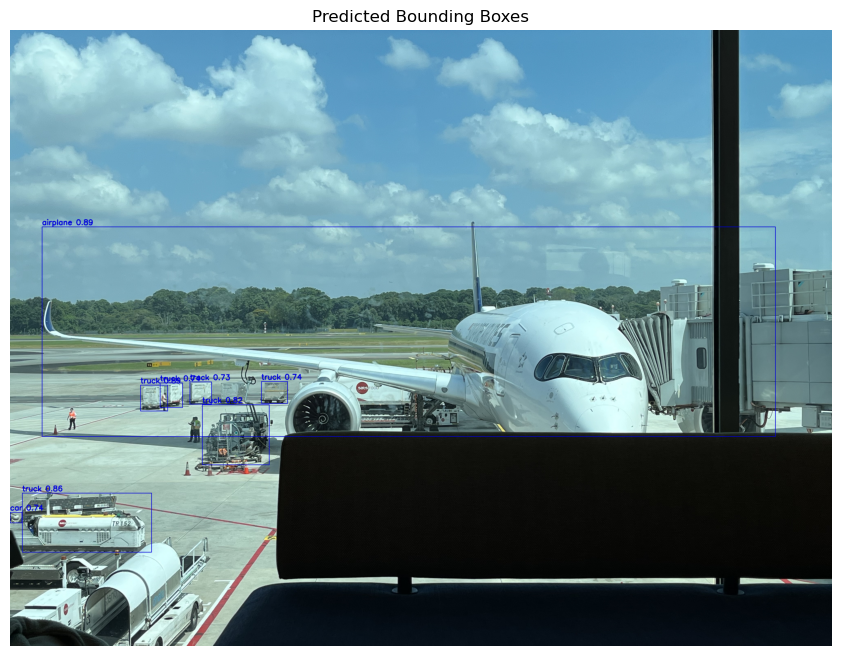

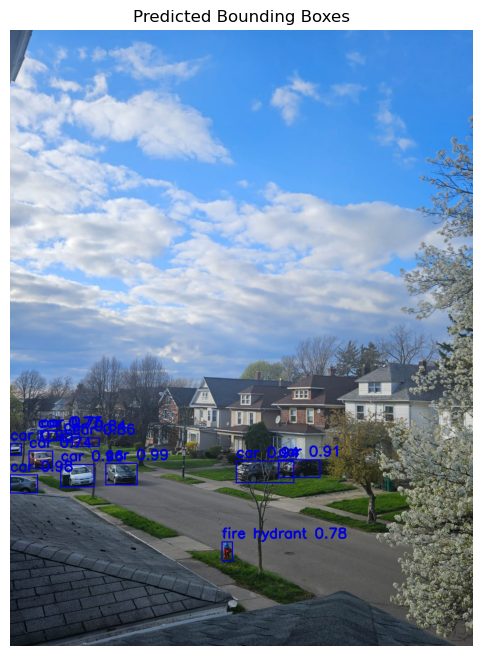

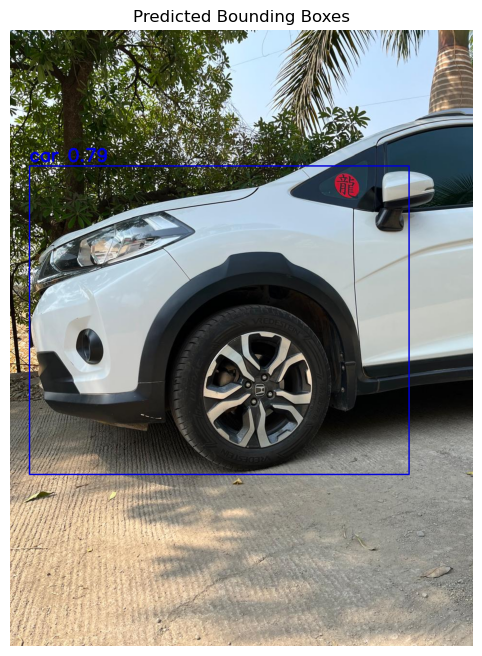

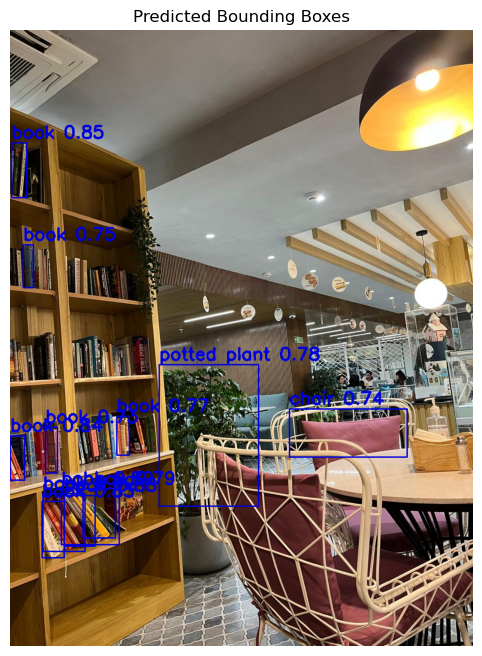

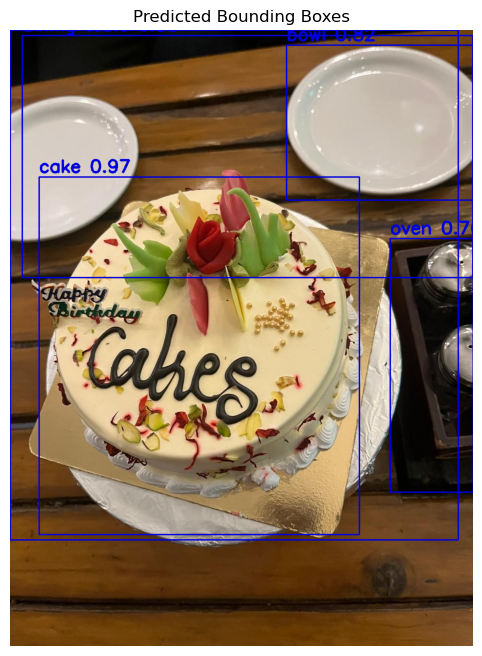

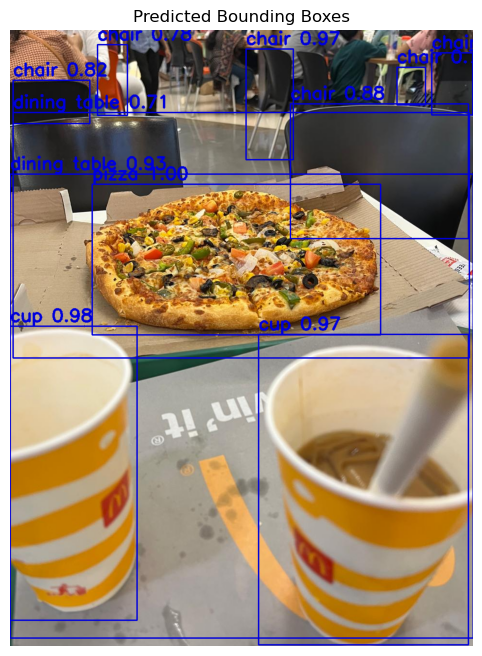

In [58]:
# Process and visualize predictions for the images
process_images(image_paths, model, device)